In [1]:
import pandas as pd
import scanpy.neighbors

import stadiffuser.utils as sutils
import warnings
import stadiffuser.utils as stutils
from _utils import *
from stadiffuser.pipeline import get_recon


warnings.filterwarnings("ignore")
sns.set_theme(context="paper", style="ticks", font_scale=1.5)
# path of the DLPFC data
DLPFC_DIR = "E:\Datasets\DLPFC"

def load_slice_data(slice_id, top_genes=3000, return_raw=False):
    adata = sc.read_visium(os.path.join(DLPFC_DIR, slice_id),
                           count_file=slice_id + "_filtered_feature_bc_matrix.h5", )
    labels = pd.read_csv(os.path.join(DLPFC_DIR, slice_id, slice_id + "_truth.txt"), index_col=0, header=None, sep="\t")
    adata.obs["ground_truth"] = labels.iloc[:, 0].values
    # remove all zero genes
    # select top genes
    sc.pp.filter_genes(adata, min_cells=10)
    if return_raw:
        raw = adata.X.copy()
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, n_top_genes=top_genes)
    high_var_genes = adata.var["highly_variable"]
    adata = adata[:, high_var_genes]
    if return_raw:
        adata_raw = adata.copy()
        adata_raw.X = raw[:, high_var_genes]
        return adata, adata_raw
    else:
        return adata


slice_id = "151676"
figure_dir = "../output/App1-DLPFC/{}/_figures".format(slice_id)
output_dir = "../output/App1-DLPFC/{}".format(slice_id)
device = torch.device("cuda:0")
method_palette = {
    'splatter':  '#8A98B8',  # Blue
    'kersplatter': '#B5BDD2',  # Lighter blue
    'zinb_spatial': "#EBAB71",  # coral
    'SRT_domain':  '#8CCF87',  # Green
    'scDesign_label': '#C0AFE2',  # Purple
    'stadiff': '#EA6666',  #coral
    "stadiff_label": "#CF4144", #lighter red
}
if not os.path.exists(figure_dir):
    os.makedirs(figure_dir)
if not os.path.exists(figure_dir):
    os.makedirs(figure_dir)

## Prepare data for multiple slices

In [156]:
slice_id_list = ["151669", "151670", "151671", "151672"]
adata_list = []
for slice_id in slice_id_list:
    adata = load_slice_data(slice_id, top_genes=3000)
    adata.var_names_make_unique()
    adata.obs["slice_id"] = slice_id
    adata_list.append(adata)
gene_list = [ad.var_names.tolist() for ad in adata_list]
anchor_genes = set(gene_list[-1])
use_genes = [set(gene_list[i]).intersection(anchor_genes) for i in range(len(gene_list) - 1)]
use_genes = set.union(*use_genes)
print(len(use_genes))
# 1902, 151507-151510

1906


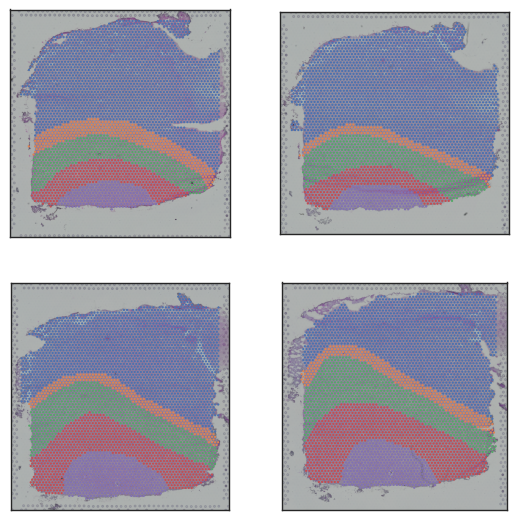

In [157]:
fig, axes = plt.subplots(2, 2, figsize=(6.5, 6.5))
for ind, ad in enumerate(adata_list):
    ax = axes.flatten()[ind]
    sc.pl.spatial(ad, basis="spatial", color="ground_truth", ncols=1, frameon=True, wspace=0.4,
                  use_raw=False, show=False, ax=ax, legend_loc='none')
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title("")

In [158]:
adata_list = []
for slice_id in slice_id_list:
    adata = load_slice_data(slice_id, top_genes=20000)
    adata = adata[:, adata.var_names.isin(use_genes)]
    adata.var_names_make_unique()
    adata.obs["slice_id"] = slice_id
    adata_list.append(adata)
adata_multi = sc.concat(adata_list, join="outer", label="slice_id")

In [155]:
new_spatial = adata_multi.obsm["spatial"].copy()
new_spatial = stutils.quantize_coordination(new_spatial, methods=[("division", 125), ("division", 125)])
adata_multi.obsm["new_spatial"] = new_spatial
adata_multi = stutils.cal_spatial_net3D(adata_multi, iter_comb=None,
                                        batch_id="slice_id", rad_cutoff=150,
                                        add_key="spatial_net")
adata_multi.write_h5ad("../output/App1-DLPFC/adata_multi_0707-10-10.h5ad")

Quantizing spatial coordinates...
Quantize 0th dimension of spatial coordinates to 0.008, mean deviation: 0.24989031220540125, pearson correlation: 0.999887610244202
Quantize 1th dimension of spatial coordinates to 0.008, mean deviation: 0.2567368712915211, pearson correlation: 0.9998986328720628
------Calculating spatial network for each batch...
Calculating spatial network for batch 0...
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 24770 edges, 4226 cells, 5.8613 neighbors per cell on average.
Calculating spatial network for batch 1...
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 25698 edges, 4384 cells, 5.8618 neighbors per cell on average.
Calculating spatial network for batch 2...
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 28172 edges, 4789 cells, 5.8826 neighbors per cell on average.
Calculating spatial network for batch 3...
------Calculating spatial graph

##  Preprocess single slice

In [514]:
# create if not exist
adata, adata_raw = load_slice_data(slice_id, return_raw=True)
# remove na in ground_truth
print("Remove {} NA in ground_truth".format(adata.obs["ground_truth"].isna().sum()))
adata = adata[~adata.obs["ground_truth"].isna()]
adata_raw = adata_raw[~adata_raw.obs["ground_truth"].isna()]
adata = sutils.cal_spatial_net2D(adata, rad_cutoff=150, add_key="spatial_net")
adata_raw.uns = adata.uns.copy()
# save adata and adata_raw to disk
adata.write_h5ad("{}/adata_processed.h5ad".format(output_dir))
adata_raw.write_h5ad("{}/adata_raw.h5ad".format(output_dir))
adata_mask = sc.read_h5ad("../output/App1-DLPFC/151676_backup/151676_mask.h5ad")
adata_mask = adata_mask[~adata_mask.obs["ground_truth"].isna()]
adata.obs = adata_mask.obs.copy()
# save to disk
adata.write_h5ad("{}/adata_processed.h5ad".format(output_dir))

Remove 29 NA in ground_truth
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 19966 edges, 3431 cells, 5.8193 neighbors per cell on average.


# Visualize the data and latent emebding

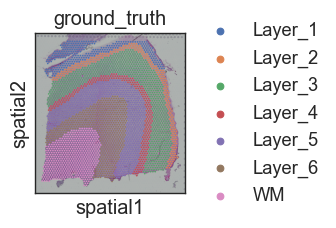

In [2]:
slice_id = "151676"
output_dir = "../output/App1-DLPFC/{}".format(slice_id)
adata = sc.read_h5ad("{}/adata_processed.h5ad".format(output_dir))
adata_raw = sc.read_h5ad("{}/adata_raw.h5ad".format(output_dir))
fig, ax = plt.subplots(figsize=(3.25, 3))
sc.pl.spatial(adata, basis="spatial", color="ground_truth", ncols=1, frameon=True, wspace=0.4,
              use_raw=False, show=False, ax=ax)
# save to _figure
plt.tight_layout()
plt.savefig("{}/spatial_ground_truth.png".format(figure_dir), dpi=600)

# Benchmark simulation on full data

In [3]:
# load autoencoder and denoiser
n_rep = 5
autoencoder = torch.load("{}/autoencoder_attn2.pth".format(output_dir)).to(device)
denoiser = torch.load("{}/denoiser.pth".format(output_dir)).to(device)
adata_real_recon = get_recon(adata, autoencoder, apply_normalize=False, device=device)
adata_real_recon = get_recon(adata, autoencoder, apply_normalize=False, device=device)
normalizer = stutils.MinMaxNormalize(adata_real_recon.obsm["latent"], dim=0)
new_spatial = adata.obsm["spatial"].copy()
new_spatial = stutils.quantize_coordination(new_spatial, methods=[("division", 125), ("division", 125)])
adata.obsm["new_spatial"] = new_spatial

Quantizing spatial coordinates...
Quantize 0th dimension of spatial coordinates to 0.008, mean deviation: 0.2500588749635675, pearson correlation: 0.999850876493874
Quantize 1th dimension of spatial coordinates to 0.008, mean deviation: 0.25002856310113675, pearson correlation: 0.9998722429659385


In [98]:
# Simulate 5 replicates through STADiffuser without labels
for seed in range(1, n_rep + 1):
    stadiff_sim = pipeline.simulate(denoiser, autoencoder, device=device, use_net="spatial_net",
                                    ref_data=adata, spatial_coord=adata.obsm["new_spatial"],
                                    seed=seed, normarlizer=normalizer)
    # save to disk
    stadiff_sim.write_h5ad("{}/stadiff_{}.h5ad".format(output_dir, seed))

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [30]:
cond_name = "ground_truth"
num_class_embeds = len(np.unique(adata.obs[cond_name]))
class_dict = dict(zip(np.unique(adata.obs[cond_name]), range(num_class_embeds)))
print("Class encoding: ")
print(class_dict)
adata.obs["encoded_label"] = adata.obs[cond_name].map(class_dict)
denoiser_label = torch.load("{}/denoiser_ground_truth.pth".format(output_dir)).to(device)

Class encoding: 
{'Layer_1': 0, 'Layer_2': 1, 'Layer_3': 2, 'Layer_4': 3, 'Layer_5': 4, 'Layer_6': 5, 'WM': 6}


In [128]:
for i in range(1, 1 + n_rep):
    stadiff_sim = pipeline.simulate(denoiser_label, autoencoder, device=device, use_net="spatial_net",
                                    ref_data=adata, spatial_coord=adata.obsm["new_spatial"],
                                    labels = adata.obs["encoded_label"].to_numpy(),
                                    seed=i, normarlizer=normalizer)
    stadiff_sim.write_h5ad("{}/stadiff_label_{}.h5ad".format(output_dir, i))

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

## Load simualted data

In [4]:
stadiff_sim_list = [sc.read_h5ad("{}/full_sim/stadiff_{}.h5ad".format(output_dir, seed + 1)) for seed in range(5)]
stadiff_label_sim = [sc.read_h5ad("{}/full_sim/stadiff_label_{}.h5ad".format(output_dir, seed + 1)) for seed in range(5)]

In [32]:
encode_labels = adata.obs["encoded_label"].to_numpy()
diff = 0
diff_label = 0
for i in np.unique(encode_labels):
    # compute the variance of the simulated within each class
    diff += np.linalg.norm(stadiff_sim_list[0].X[encode_labels == i] - stadiff_sim_list[4].X[encode_labels == i])
    diff_label += np.linalg.norm(stadiff_label_sim[0].X[encode_labels == i] - stadiff_label_sim[4].X[encode_labels == i])
print("Difference between 1st and 5th replicate: ", diff / len(np.unique(encode_labels)))
print("Difference between 1st and 5th replicate with label: ", diff_label / len(np.unique(encode_labels)))

Difference between 1st and 5th replicate:  16.127356937953405
Difference between 1st and 5th replicate with label:  30.113240923200333


## Compare with competing methods

In [5]:
comp_methods = ["splatter", "kersplatter", "zinb_spatial",  "scDesign_label", "SRT_domain", "stadiff", "stadiff_label"]
comp_sim_dict = dict()
for comp_method in comp_methods:
    adata_list = [sc.read_h5ad("{}/full_sim/{}_{}.h5ad".format(output_dir, comp_method, seed + 1)) for seed in range(n_rep)]
    comp_sim_dict[comp_method] = adata_list

In [50]:
method_palette = {
    'splatter':  '#909AB2',  # Blue
    'kersplatter': '#B9BFCE',  # Lighter blue
    'zinb_spatial': "#DCAC80",  # coral
    'SRT_domain':  '#94C690',  # Green
    'scDesign_label': '#C2B5DC',  # Purple
    'stadiff': '#D97777',  #red
    "stadiff_label": "#D97777", #red
}


In [36]:
import itertools
def compute_sim_perf(sim_adata_list, autoencoder, adata_raw, adata_real_recon,
                     enhanced = False,
                     n_rep=5,
                     device="cuda:0"):
    sim_perf = dict()
    metric_names = ["cell_corr", "enhanced_cell_corr", "pairwise_cell_corr", "pairwise_enhanced_cell_corr"]
    metric_names += ["gene_corr", "enhanced_gene_corr", "pairwise_gene_corr", "pairwise_enhanced_gene_corr"]
    for name in metric_names:
        sim_perf[name] = []
    if not enhanced:
        adata_sim_recon_list = []
    else:
        adata_sim_recon_list = sim_adata_list
    for ind in range(n_rep):
        adata_sim = sim_adata_list[ind]
        if not enhanced:
            adata_sim_recon = get_recon(adata_sim, autoencoder, device=device, use_net="spatial_net")
            adata_sim_recon_list.append(adata_sim_recon)
        else:
            adata_sim_recon = adata_sim
        for dim in ["cell", "gene"]:
            sim_perf[dim + "_corr"].append(np.nanmean(metrics.compute_corr(adata_sim, adata_raw, dim=dim)))
            sim_perf["enhanced_" + dim + "_corr"].append(np.nanmean(metrics.compute_corr(adata_sim_recon, adata_real_recon, dim=dim)))

    for (i, j) in itertools.combinations(range(n_rep), 2):
        for dim in ["cell", "gene"]:
            sim_perf["pairwise_" + dim + "_corr"].append(np.nanmean(metrics.compute_corr(sim_adata_list[i], sim_adata_list[j], dim=dim)))
            sim_perf["pairwise_enhanced_" + dim + "_corr"].append(np.nanmean(metrics.compute_corr(adata_sim_recon_list[i], adata_sim_recon_list[j], dim=dim)))
    return sim_perf

In [37]:
gene_corr = dict()
for sim_name in comp_sim_dict:
    sim_adata = comp_sim_dict[sim_name][0].copy()
    sim_adata.uns["spatial_net"] = adata_real_recon.uns["spatial_net"]
    if sim_name == "stadiff_label" or sim_name == "stadiff":
        sim_adata_recon = sim_adata

    else:
        sim_adata.obs_names = adata.obs_names
        sim_adata.var_names = adata.var_names
        sim_adata.X = sim_adata.X.toarray()
        sim_adata.obsm["spatial"] = adata.obsm["spatial"]
        sim_adata_recon = get_recon(sim_adata, autoencoder, device=device, use_net="spatial_net")
    gene_corr[sim_name] = metrics.compute_corr(sim_adata_recon, adata_real_recon, dim="gene")

### Plot gene correlation

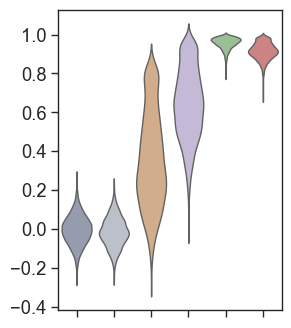

In [64]:
gene_corr_df = pd.DataFrame(gene_corr)
plot_methods = ["splatter", "kersplatter", "zinb_spatial", "scDesign_label", "SRT_domain", "stadiff_label"]
gene_corr_df = gene_corr_df[plot_methods].melt(var_name="method", value_name="correlation")
# plot boxplot for gene correlation
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.5))
# plot violin plot with edge color different and filling is blank
sns.violinplot(x="method", y="correlation", data=gene_corr_df, ax=ax,  scale='width',
               inner=None, palette={method: method_palette[method] for method in plot_methods},
               fill=True)
# set x label to empty and x axis to empty
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels([])
plt.tight_layout()
# save to disk
fig.savefig("{}/gene_corr.png".format(figure_dir), dpi=600)

In [67]:
comp_perf_dict = dict()
# adata_raw.X = adata_raw.X.toarray()
for name in comp_methods:
    print("==== {} ====".format(name))
    adata_list = comp_sim_dict[name]
    if name == "stadiff_label" or name == "stadiff":
        comp_perf_dict[sim_name] = compute_sim_perf(comp_sim_dict[sim_name], autoencoder, adata_raw, adata_real_recon,
                                                    enhanced=True, n_rep=5, device=device)
    else:
        adata_temp_list = []
        for a in adata_list:
            a = a.copy()
            a.X = a.X.toarray()
            a.uns["spatial_net"] = adata.uns["spatial_net"]
            a.obsm["spatial"] = adata.obsm["spatial"]
            # set obs_name
            a.obs_names = adata.obs_names
            adata_temp_list.append(a)
        adata_list = adata_temp_list
        comp_perf_dict[name] = compute_sim_perf(adata_list, autoencoder, adata_raw, adata_real_recon,
                                               enhanced=False, n_rep=5, device=device)

==== splatter ====
==== kersplatter ====
==== zinb_spatial ====
==== scDesign_label ====
==== SRT_domain ====
==== stadiff ====
==== stadiff_label ====


In [40]:
metric_names = ["cell_corr", "enhanced_cell_corr", "pairwise_cell_corr", "pairwise_enhanced_cell_corr"]
metric_names += ["gene_corr", "enhanced_gene_corr", "pairwise_gene_corr", "pairwise_enhanced_gene_corr"]
perf_df = []
methods_list = comp_perf_dict.keys()
for sim_name in methods_list:
    perf_df.append([np.nanmean(comp_perf_dict[sim_name][name]) for name in metric_names])
perf_df = pd.DataFrame(perf_df, index=methods_list, columns=metric_names)
for group in ["cell", "gene"]:
    perf_df["enhanced_" + group + "_diversity"] = 1 - perf_df["pairwise_enhanced_" + group + "_corr"]
    perf_df[group + "_diversity"] = 1 - perf_df["pairwise_" + group + "_corr"]

In [41]:
perf_df

,cell_corr,enhanced_cell_corr,pairwise_cell_corr,pairwise_enhanced_cell_corr,gene_corr,enhanced_gene_corr,pairwise_gene_corr,pairwise_enhanced_gene_corr,enhanced_cell_diversity,cell_diversity,enhanced_gene_diversity,gene_diversity
splatter,-0.003368,0.902381,-0.002951,0.952899,-0.000049,-0.008786,-0.000011,-0.003696,0.047101,1.002951,1.003696,1.000011
kersplatter,-0.002418,0.910551,0.006835,0.942300,0.000027,-0.007070,-0.000041,-0.001618,0.057700,0.993165,1.001618,1.000041
zinb_spatial,0.865166,0.961747,0.856984,0.991023,0.018320,0.362838,0.023213,0.747559,0.008977,0.143016,0.252441,0.976787
scDesign_label,0.955935,0.979216,0.955368,0.998127,0.024832,0.640834,0.023465,0.861172,0.001873,0.044632,0.138828,0.976535
SRT_domain,0.997774,0.988186,0.997154,0.996545,0.866484,0.954721,0.809314,0.982083,0.003455,0.002846,0.017917,0.190686
stadiff_label,0.734896,0.997275,0.996816,0.996816,0.130159,0.912350,0.858504,0.858504,0.003184,0.003184,0.141496,0.141496


#### Plot diversity v.s. fidelity

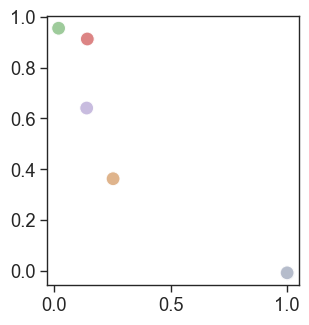

In [48]:
perf_df_drop = perf_df
markers = ["v", "^", "o", "s", "D", "P"]
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.5))
# set color palette
perf_df_drop["method"] = perf_df_drop.index
sns.scatterplot(data=perf_df_drop, x="enhanced_gene_diversity", y="enhanced_gene_corr",
                hue="method",
                ax=ax,
                style="method",
                palette={method: method_palette[method] for method in comp_methods},
                markers = "o",
                alpha=0.9,
                legend=False, s=100)
# ax.set_ylim(0.2, 1)
ax.set_xlabel("")
ax.set_ylabel("")
fig.set_size_inches(3.25, 3.5)
plt.savefig(os.path.join(figure_dir, "enhanced_gene_corr_diversity.png"), dpi=300)
# set tick font size to 7
# save figure to file

In [69]:
sub_df = perf_df_drop[["enhanced_gene_diversity", "enhanced_gene_corr"]]
sub_df

,enhanced_gene_diversity,enhanced_gene_corr
splatter,1.003696,-0.008786
kersplatter,1.001618,-0.007070
zinb_spatial,0.252441,0.362838
scDesign_label,0.138828,0.640834
SRT_domain,0.017917,0.954721
stadiff_label,0.141496,0.912350


### Plot mLSI barplot

In [88]:
import scipy.stats as stats

plot_methods = ["splatter", "kersplatter", "zinb_spatial", "scDesign_label", "SRT_domain", "stadiff_label"]
comp_perf_dict = {k: dict() for k in plot_methods}
adata_real_recon = get_recon(adata, autoencoder, device=device, use_net="spatial_net", apply_normalize=False)
adata_real_recon.obsm["latent"] = stats.zscore(adata_real_recon.obsm["latent"], axis=0)
for method_name in plot_methods:
    comp_perf_dict[method_name]["mLISI"] = []
    adata_sim = comp_sim_dict[method_name][0]
    if method_name == "stadiff_label" or method_name == "stadiff":
        adata_sim_recon = adata_sim
    else:
        adata_sim = adata_sim.copy()
        adata_sim.X = adata_sim.X.toarray()
        adata_sim.uns["spatial_net"] = adata.uns["spatial_net"]
        adata_sim.obsm["spatial"] = adata.obsm["spatial"]
        adata_sim.obs_names = adata.obs_names
        adata_sim_recon = pipeline.get_recon(adata_sim, autoencoder, device=device, use_net="spatial_net", apply_normalize=True)
    adata_sim_recon.obsm["latent"] = stats.zscore(adata_sim_recon.obsm["latent"], axis=0)
    mlisi = metrics.compute_paired_lisi(adata_sim_recon, adata_real_recon, zscore=False)
    comp_perf_dict[method_name]["mLISI"].append(mlisi)
    print("Method: {}, mLISI: {}".format(method_name, np.nanmean(mlisi)))

Method: splatter, mLISI: 1.1895525221346406
Method: kersplatter, mLISI: 1.129165043644461
Method: zinb_spatial, mLISI: 1.0071208512019607
Method: scDesign_label, mLISI: 1.5554392976302576
Method: SRT_domain, mLISI: 1.9452870231030905
Method: stadiff_label, mLISI: 1.9448319645676158


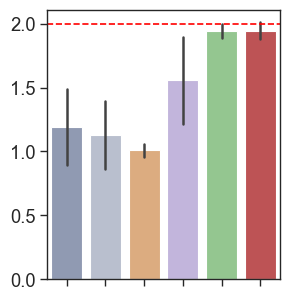

In [90]:
# plot barplot for mLISI
mLISI_df = []
# add column to mLISI_df
for sim_name in plot_methods:
    mLISI_df.append(comp_perf_dict[sim_name]["mLISI"][0])
# convert to dataframe
mLISI_df = np.array(mLISI_df).squeeze().T
mLISI_df = pd.DataFrame(mLISI_df, columns=plot_methods)
fig, ax = plt.subplots(1, 1, figsize=(3, 3.5))
sns.barplot(data=mLISI_df, ax=ax,
            palette={method: method_palette[method] for method in plot_methods}, ci="sd")
# set a horizontal line at 2
ax.axhline(2, color="red", linestyle="--")
# set x label to empty and x axis to empty
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels([])
# save to disk
fig.savefig("{}/mLISI.png".format(figure_dir), dpi=600)

###  Compare latent embedding

In [9]:
import scipy
from scipy.stats import spearmanr, pearsonr

def plot_umap(adata, latent, title=None, ax=None, frameon=False, seed=None):
    # if x is not torch tensor, convert it to torch tensor
    # if x is sparse matrix, convert it to numpy
    # set seed
    if seed is not None:
        np.random.seed(seed)
    adata.obsm["latent"] = latent
    sc.pp.neighbors(adata, use_rep="latent", n_neighbors=30)
    sc.tl.umap(adata, min_dist=0.5)
    sc.pl.umap(adata, color=["ground_truth"], ncols=1, frameon=frameon, wspace=0.4,
               use_raw=False, show=False, title=title, ax=ax, legend_loc='none')

In [475]:
adata_temp = adata.copy()
for method_name in comp_methods:
    adata_sim = comp_sim_dict[method_name][0]
    if method_name == "stadiff_label" or method_name == "stadiff":
        adata_sim_recon = adata_sim
        adata_temp.uns[method_name + "_recon"] = adata_sim_recon.X
        adata_temp.obsm[method_name + "_latent"] = adata_sim_recon.obsm["latent"]
    else:
        adata_sim = adata_sim.copy()
        adata_sim.X = adata_sim.X.toarray()
        adata_sim.uns["spatial_net"] = adata.uns["spatial_net"]
        adata_sim.obsm["spatial"] = adata.obsm["spatial"]
        adata_sim.obs_names = adata.obs_names
        adata_sim_recon = get_recon(adata_sim, autoencoder, device=device, use_net="spatial_net")
        adata_temp.uns[method_name + "_recon"] = adata_sim_recon.X
        adata_temp.obsm[method_name + "_latent"] = adata_sim_recon.obsm["latent"]

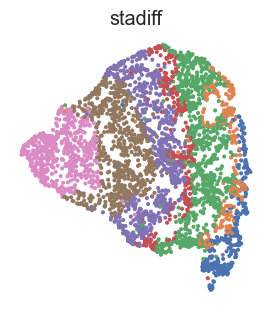

In [481]:
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.5))
method_name = "stadiff"
plot_umap(adata_temp, adata_temp.obsm[method_name + "_latent"], title=method_name, ax=ax, frameon=False)

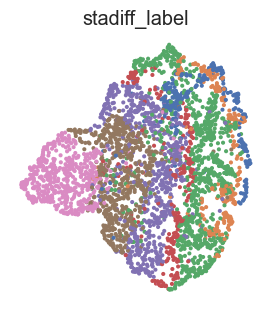

In [490]:
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.5))
method_name = "stadiff_label"
adata_sim = comp_sim_dict[method_name][2]
plot_umap(adata_temp, adata_temp.obsm[method_name + "_latent"], title=method_name, ax=ax, frameon=False)

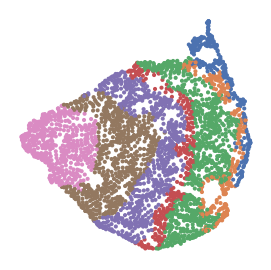

In [89]:
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
method_name = "ground_truth"
plot_umap(adata_real_recon, adata_real_recon.obsm["latent"], title=method_name, ax=ax, frameon=False)
ax.set_title("")
# save figure to file
fig.savefig("{}/umap_full.png".format(figure_dir), dpi=600)

In [68]:
metrics.compute_paired_lisi(comp_sim_dict["stadiff_label"][0], adata_real_recon).mean()

1.9414012342367637

In [500]:
adata_sim = comp_sim_dict["SRT_domain"][0]
adata_sim = adata_sim.copy()
adata_sim.X = adata_sim.X.toarray()
adata_sim.uns["spatial_net"] = adata.uns["spatial_net"]
adata_sim.obsm["spatial"] = adata.obsm["spatial"]
adata_sim.obs_names = adata.obs_names
adata_sim_recon = get_recon(adata_sim, autoencoder, device=device, use_net="spatial_net")
metrics.compute_paired_lisi(adata_sim_recon, adata_real_recon).mean()

1.9449868886579293

# Benchmark on masking data

In [36]:
from stadiffuser.utils import mask_region
adata = sc.read_h5ad("../output/App1-DLPFC/{}/adata_processed.h5ad".format("151676"))
adata_raw = sc.read_h5ad("../output/App1-DLPFC/{}/adata_raw.h5ad".format("151676"))
mask = "circle-2"
denoiser_masked = torch.load("{}/{}/denoiser.pth".format(output_dir, mask), map_location="cuda:0")
autoencoder_masked = torch.load("{}/{}/autoencoder_attn2.pth".format(output_dir, mask), map_location="cuda:0").to(device)
new_spatial = adata.obsm["spatial"].copy()
new_spatial = stutils.quantize_coordination(new_spatial, methods=[("division", 125), ("division", 125)])
adata.obsm["new_spatial"] = new_spatial
adata_masked = mask_region(adata, mask)
adata_masked_recon = get_recon(adata_masked, autoencoder_masked, device=device, use_net="spatial_net",
                               apply_normalize=False)
normalizer = stutils.MinMaxNormalize(adata_masked_recon.obsm["latent"], dim=0)
data = pipeline.prepare_dataset(adata, device=device, use_net="spatial_net")

Quantizing spatial coordinates...
Quantize 0th dimension of spatial coordinates to 0.008, mean deviation: 0.2500588749635675, pearson correlation: 0.9998508764938737
Quantize 1th dimension of spatial coordinates to 0.008, mean deviation: 0.25002856310113675, pearson correlation: 0.9998722429659386
--------------------
Remove 123 nodes and 820 edges from the original data


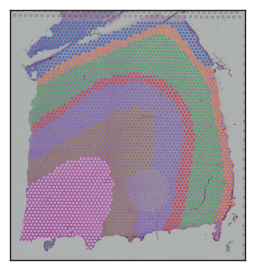

In [37]:
adata_temp = adata.copy()
# set masked ground truth to None
adata_temp.obs["ground_truth"][~adata_temp.obs[mask]] = None
# plot the masked ground truth
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
sc.pl.spatial(adata_temp, basis="spatial", color="ground_truth", ncols=1, frameon=True, wspace=0.4,
              use_raw=False, show=False, ax=ax, legend_loc='none')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title("")
# save to disk
fig.savefig("{}/masked_{}_ground_truth.png".format(figure_dir, mask), dpi=600)

In [38]:
# simulate
n_rep = 5
for i in range(1, n_rep+1):
    adata_sim = pipeline.simulate(denoiser_masked, autoencoder_masked, device=device, use_net="spatial_net",
                                    ref_data=adata, spatial_coord=adata.obsm["new_spatial"],
                                    seed=i, normarlizer=normalizer)
    adata_sim.write_h5ad("{}/{}/stadiff_{}.h5ad".format(output_dir, mask, i))

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [39]:
stadiff_reccon_list = [sc.read_h5ad("{}/{}/stadiff_{}.h5ad".format(output_dir, mask, i)) for i in range(1, n_rep+1)]
srt_recon_list = []
for i in range(1, n_rep + 1):
    adata_srt = sc.read_h5ad(os.path.join(output_dir, mask) + "/SRTSim_fill_inplace{}.h5ad".format(i))
    adata_srt.obsm["spatial"] = adata.obsm["spatial"]
    adata_srt.uns["spatial_net"] = adata.uns["spatial_net"]
    adata_srt.obs_names = adata.obs_names
    adata_srt.obs["ground_truth"] = adata.obs["ground_truth"]
    adata_srt_recon = get_recon(adata_srt, autoencoder_masked, device=device, use_net="spatial_net",
                                   apply_normalize=True)
    srt_recon_list.append(adata_srt_recon)

## Visualize umap

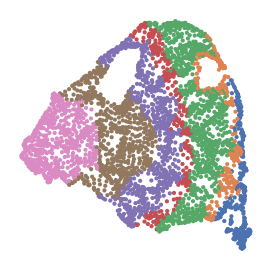

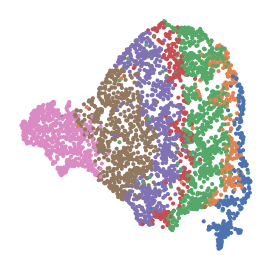

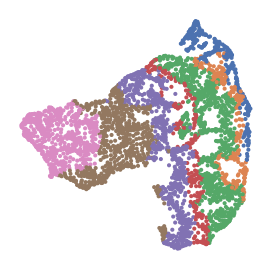

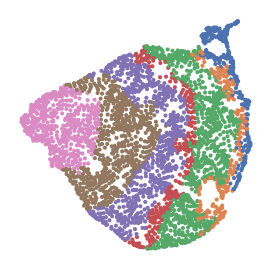

In [40]:
# visulize by umap
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
plot_umap(adata_masked, adata_masked_recon.obsm["latent"], title="masked", ax=ax, frameon=False, seed=2024)
ax.set_title("")
plt.savefig("{}/umap_{}.png".format(figure_dir, mask), dpi=600)
# plot umap for stadiff
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
plot_umap(stadiff_reccon_list[0], stadiff_reccon_list[0].obsm["latent"], title="", ax=ax, frameon=False, seed=42)
plt.savefig("{}/umap_{}_stadiff.png".format(figure_dir, mask), dpi=600)
# plot umap for srt
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
plot_umap(srt_recon_list[0], srt_recon_list[0].obsm["latent"], title="", ax=ax, frameon=False, seed=2024)
plt.savefig("{}/umap_{}_srt.png".format(figure_dir, mask), dpi=600)
# plot umap for ground truth
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
plot_umap(adata_real_recon, adata_real_recon.obsm["latent"], title="", ax=ax, frameon=False, seed=2024)

In [48]:
srt_lsi = metrics.compute_paired_lisi(srt_recon_list[0], adata_real_recon, use_rep="X_umap")
stadiff_lsi = metrics.compute_paired_lisi(stadiff_reccon_list[0], adata_real_recon, use_rep="X_umap")
print("STADiffuser mLSI: {:.3f} ({:.3f})".format(stadiff_lsi.mean(), stadiff_lsi.std()))
print("SRTSim      mLSI: {:.3f} ({:.3f})".format(srt_lsi.mean(), srt_lsi.std()))
# write the information to file
with open("{}/{}/summary.txt".format(output_dir, mask), "w") as f:
    f.write("STADiffuser mLSI: {:.3f} ({:.3f})\n".format(stadiff_lsi.mean(), stadiff_lsi.std()))
    f.write("SRTSim      mLSI: {:.3f} ({:.3f})\n".format(srt_lsi.mean(), srt_lsi.std()))

STADiffuser mLSI: 1.721 (0.308)
SRTSim      mLSI: 1.665 (0.331)


In [44]:
def upside_down(adata):
    adata_ = adata.copy()
    adata_.obsm["spatial"][:, 1] = -adata_.obsm["spatial"][:, 1]
    return adata_

def plot_gene_recon(adata_raw, adata_real_recon, adata_srt, adata_stadiff,
                    gene_name, figsize=(12, 3), vmax="p99.5"):
    # Plot raw data
    fig, axes = plt.subplots(1, 4, figsize=figsize)
    sc.pl.embedding(upside_down(adata_raw), basis="spatial", color=gene_name, ax=axes[0],
                    show=False, wspace=0.4, frameon=False, cmap="viridis", vmax=vmax)
    axes[0].collections[0].colorbar.remove()
    axes[0].set_title("")
    # Plot real reconstruction
    sc.pl.embedding(upside_down(adata_real_recon), basis="spatial", color=gene_name, ax=axes[1],
                    show=False, wspace=0.4, frameon=False, cmap="viridis", vmax=vmax)
    axes[1].collections[0].colorbar.remove()
    axes[1].set_title("")

    # Plot reconstructions from srt_recon_list and stadiff_reccon_list
    for ind, sim_recon in enumerate([adata_srt, adata_stadiff]):
        sim_recon.obsm["spatial"] = adata_real_recon.obsm["spatial"]
        sim_recon.var_names = adata_real_recon.var_names
        sc.pl.embedding(upside_down(sim_recon), basis="spatial", color=gene_name, ax=axes[ind + 2],
                        show=False, wspace=0.4, frameon=False, cmap="viridis", vmax=vmax)
        axes[ind + 2].collections[0].colorbar.remove()
        axes[ind + 2].set_title("")
    return fig

## Plot representative genes

In [49]:
stadiff_corr = metrics.compute_corr(stadiff_reccon_list[0], adata_real_recon, dim="gene")
srt_corr = metrics.compute_corr(srt_recon_list[0], adata_real_recon, dim="gene")

B3GALT2 0.9492379129598709 0.8595526026673218
KRT17 0.9651153696818409 0.8542706129710527


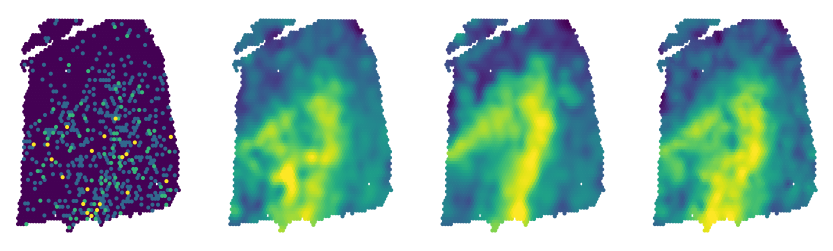

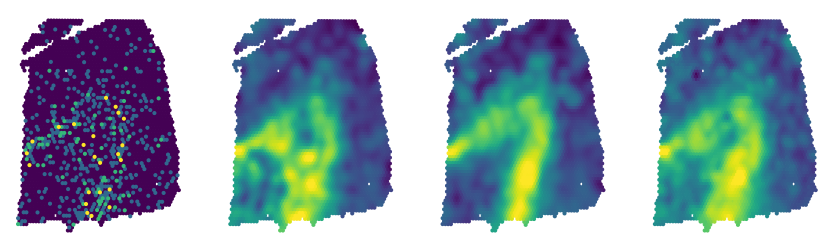

In [53]:
gene_names = ["B3GALT2", "KRT17"]
for gene_name in gene_names:
    gene_index = np.where(adata_real_recon.var_names == gene_name)[0][0]
    print(gene_name, stadiff_corr[gene_index], srt_corr[gene_index])
    fig = plot_gene_recon(adata_raw, adata_real_recon, srt_recon_list[0], stadiff_reccon_list[0], gene_name, figsize=(10.5, 3))
    # save to file
    fig.savefig("{}/{}_{}_recon.png".format(figure_dir, mask, gene_name), dpi=600)
    with open("{}/{}/summary.txt".format(output_dir, mask), "a") as f:
        f.write("{}: {:.3f} ({:.3f})\n".format(gene_name, stadiff_corr[gene_index], srt_corr[gene_index]))

In [54]:
result_lsi = pd.DataFrame({"lsi": stadiff_lsi[:, 0],
                           "method": "STADiffuser"})
result_lsi = result_lsi.append(pd.DataFrame({"lsi": srt_lsi[:, 0],
                                            "method": "SRTSim"}, index=result_lsi.index))
# add a column form mask
result_lsi["mask"] = mask
result_lsi.to_csv("{}/{}/lsi.csv".format(output_dir, mask), index=False)
result_gene_corr = pd.DataFrame({"gene_corr": stadiff_corr,
                                 "method": "STADiffuser"})
result_gene_corr = result_gene_corr.append(pd.DataFrame({"gene_corr": srt_corr,
                                                        "method": "SRTSim"}, index=result_gene_corr.index))
result_gene_corr["mask"] = mask
result_gene_corr.to_csv("{}/{}/gene_corr.csv".format(output_dir, mask), index=False)

## Compare LSI and gene correlation between STADiffuser and SRTSim

In [56]:
mask_names = ["random_0.1", "circle-2", "rectangle-1", "strip"]
# load lsi from disk
result_lsi = []
result_gene_corr = []
for mask in mask_names:
    print(mask)
    result_lsi.append(pd.read_csv("{}/{}/lsi.csv".format(output_dir, mask)))
    result_gene_corr.append(pd.read_csv("{}/{}/gene_corr.csv".format(output_dir, mask)))

random_0.1
circle-2
rectangle-1
strip


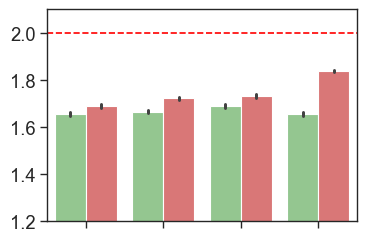

In [58]:
# plot lsi barplot
plot_palette = {"STADiffuser": method_palette["stadiff"],
                "SRTSim": method_palette["SRT_domain"]}
fig, ax = plt.subplots(1, 1, figsize=(4, 2.75))
sns.barplot(data=pd.concat(result_lsi), x="mask", y="lsi", hue="method", ax=ax,
            order=["random_0.1", "circle-2", "rectangle-1", "strip"],
            palette=plot_palette, ci=95, hue_order=["SRTSim", "STADiffuser"])
ax.set_ylim(1.2, 2.1)
ax.axhline(2, color="red", linestyle="--")
# set legend to none
ax.legend().remove()
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels([])
# save to fig
fig.savefig("{}/lsi_barplot.png".format(figure_dir), dpi=600)

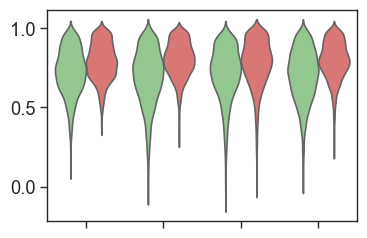

In [59]:
# plot the gene correlation violin plot
fig, ax = plt.subplots(1, 1, figsize=(4, 2.75))
gene_corr_df = pd.concat(result_gene_corr)
sns.violinplot(data=gene_corr_df, x="mask", y="gene_corr", hue="method", ax=ax, hue_order=["SRTSim", "STADiffuser"],
               order=["random_0.1", "circle-2", "rectangle-1", "strip"],
               palette=plot_palette, inner=None, scale="width", fill=False)
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels([])
# remove legend
ax.legend().remove()
# save to file
fig.savefig("{}/gene_corr_violin.png".format(figure_dir), dpi=600)

In [158]:
# compute the p-value
# compute the p-value
print("STADiffuser vs SRTSim mLSI")
for mask in mask_names:
    print(mask)
    result_lsi = pd.read_csv("{}/{}/lsi.csv".format(output_dir, mask))
    print(scipy.stats.ttest_rel(result_lsi[result_lsi["method"] == "STADiffuser"]["lsi"],
                                result_lsi[result_lsi["method"] == "SRTSim"]["lsi"]))
print("STADiffuser vs SRTSim gene correlation")
for mask in mask_names:
    print(mask)
    result_gene_corr = pd.read_csv("{}/{}/gene_corr.csv".format(output_dir, mask))
    print(scipy.stats.ttest_rel(result_gene_corr[result_gene_corr["method"] == "STADiffuser"]["gene_corr"],
                                result_gene_corr[result_gene_corr["method"] == "SRTSim"]["gene_corr"]))

circle-1
TtestResult(statistic=56.44499125054376, pvalue=0.0, df=2999)
rectangle-1
TtestResult(statistic=37.50772475073175, pvalue=8.273851399583425e-253, df=2999)
strip
TtestResult(statistic=51.23203843859228, pvalue=0.0, df=2999)


In [60]:
# print mean correlation
for mask in mask_names:
    print(mask)
    result_gene_corr = pd.read_csv("{}/{}/gene_corr.csv".format(output_dir, mask))
    print(result_gene_corr.groupby("method")["gene_corr"].mean())

random_0.1
method
SRTSim         0.725671
STADiffuser    0.788132
Name: gene_corr, dtype: float64
circle-2
method
SRTSim         0.691791
STADiffuser    0.801866
Name: gene_corr, dtype: float64
rectangle-1
method
SRTSim         0.711751
STADiffuser    0.777272
Name: gene_corr, dtype: float64
strip
method
SRTSim         0.703950
STADiffuser    0.794223
Name: gene_corr, dtype: float64


## Super resolution

In [12]:
from stadiffuser.utils import mask_region
from scipy import stats
missing_rates = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8]
adata = sc.read_h5ad("../output/App1-DLPFC/{}/adata_processed.h5ad".format("151676"))
n_rep = 5
autoencoder = torch.load("{}/autoencoder_attn2.pth".format(output_dir), map_location="cuda:0").to(device)

In [5]:
for missing_rate in missing_rates:
    print("Missing rate: ", missing_rate)
    mask = "random_{}".format(missing_rate)
    denoiser_masked = torch.load("{}/{}/denoiser.pth".format(output_dir, mask), map_location="cuda:0")
    autoencoder_masked = torch.load("{}/{}/autoencoder_attn2.pth".format(output_dir, mask), map_location="cuda:0").to(device)
    new_spatial = adata.obsm["spatial"].copy()
    new_spatial = stutils.quantize_coordination(new_spatial, methods=[("division", 125), ("division", 125)])
    adata.obsm["new_spatial"] = new_spatial
    adata_masked = mask_region(adata, mask)
    adata_masked_recon = get_recon(adata_masked, autoencoder_masked, device=device, use_net="spatial_net",
                                   apply_normalize=False)
    normalizer = stutils.MinMaxNormalize(adata_masked_recon.obsm["latent"], dim=0)
    data = pipeline.prepare_dataset(adata, device=device, use_net="spatial_net")
    # simulate
    for i in range(1, n_rep+1):
        adata_sim = pipeline.simulate(denoiser_masked, autoencoder_masked, device=device, use_net="spatial_net",
                                      ref_data=adata, spatial_coord=adata.obsm["new_spatial"],
                                      seed=i, normarlizer=normalizer)
        adata_sim.write_h5ad("{}/{}/stadiff_{}.h5ad".format(output_dir, mask, i))

Missing rate:  0.1
Quantizing spatial coordinates...
Quantize 0th dimension of spatial coordinates to 0.008, mean deviation: 0.2500588749635675, pearson correlation: 0.999850876493874
Quantize 1th dimension of spatial coordinates to 0.008, mean deviation: 0.25002856310113675, pearson correlation: 0.9998722429659385
--------------------
Remove 343 nodes and 3812 edges from the original data


  0%|          | 0/1000 [00:00<?, ?it/s]

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:20                                                                                   │
│                                                                                                  │
│   17 │   data = pipeline.prepare_dataset(adata, device=device, use_net="spatial_net")            │
│   18 │   # simulate                                                                              │
│   19 │   for i in range(1, n_rep+1):                                                             │
│ ❱ 20 │   │   adata_sim = pipeline.simulate(denoiser_masked, autoencoder_masked, device=device    │
│   21 │   │   │   │   │   │   │   │   │     ref_data=adata, spatial_coord=adata.obsm["new_spat    │
│   22 │   │   │   │   │   │   │   │   │     seed=i, normarlizer=normalizer)                       │
│   23 │   │   adata_sim.write_h5ad("{}/{}/stadiff_{}.h5ad".format(output_dir, mask, i))           │
│                                                                                                  │
│ E:\Projects\diffusion\stadiffuser\pipeline.py:509 in simulate                                    │
│                                                                                                  │
│   506 │   │   else:                                                                              │
│   507 │   │   │   iterator = noise_scheduler.timesteps                                           │
│   508 │   │   for t in iterator:                                                                 │
│ ❱ 509 │   │   │   model_output = denoiser(sim_embed, t, spatial_coord, class_labels=labels).sa   │
│   510 │   │   │   sim_embed = noise_scheduler.step(model_output, t, sim_embed).prev_sample       │
│   511 │   sim_embed = torch.squeeze(sim_embed, 1)                                                │
│   512                                                                                            │
│                                                                                                  │
│ C:\Users\001\anaconda3\envs\STADiffusion\lib\site-packages\torch\nn\modules\module.py:1194 in    │
│ _call_impl                                                                                       │
│                                                                                                  │
│   1191 │   │   # this function, and just call forward.                                           │
│   1192 │   │   if not (self._backward_hooks or self._forward_hooks or self._forward_pre_hooks o  │
│   1193 │   │   │   │   or _global_forward_hooks or _global_forward_pre_hooks):                   │
│ ❱ 1194 │   │   │   return forward_call(*input, **kwargs)                                         │
│   1195 │   │   # Do not call functions when jit is used                                          │
│   1196 │   │   full_backward_hooks, non_full_backward_hooks = [], []                             │
│   1197 │   │   if self._backward_hooks or _global_backward_hooks:                                │
│                                                                                                  │
│ E:\Projects\diffusion\stadiffuser\models.py:254 in forward                                       │
│                                                                                                  │
│   251 │   │   if not torch.is_tensor(timesteps):                                                 │
│   252 │   │   │   timesteps = torch.tensor([timesteps], dtype=torch.long, device=sample.device   │
│   253 │   │   elif torch.is_tensor(timesteps) and len(timesteps.shape) == 0:                     │
│ ❱ 254 │   │   │   timesteps = timesteps[None].to(sample.device)                                  │
│   255 │   │                                                                                      │
│   256 │   │   timestep_embed = self.time_proj(timesteps)   

In [28]:
missing_rates = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8]
stadiff_sim_list = []
srt_sim_list = []
srt_sim_recon_list = []
for missing_rate in missing_rates:
    print("Missing rate: ", missing_rate)
    mask = "random_{}".format(missing_rate)
    stadiff_sim = sc.read_h5ad("{}/{}/stadiff_1.h5ad".format(output_dir, mask))
    srt_sim = sc.read_h5ad("{}/{}/SRTSim_fill_inplace1.h5ad".format(output_dir, mask))
    # add spatial information
    srt_sim.obsm["spatial"] = adata.obsm["spatial"]
    srt_sim.uns["spatial_net"] = adata.uns["spatial_net"]
    srt_sim.obs_names = adata.obs_names
    srt_sim.obs["ground_truth"] = adata.obs["ground_truth"]
    autoencoder_masked = torch.load("{}/{}/autoencoder_attn2.pth".format(output_dir, mask), map_location="cuda:0").to(device)
    srt_sim_recon = get_recon(srt_sim, autoencoder_masked, device=device, use_net="spatial_net",
                               apply_normalize=True)
    stadiff_sim_list.append(stadiff_sim)
    srt_sim_list.append(srt_sim)
    srt_sim_recon_list.append(srt_sim_recon)

Missing rate:  0.1
Missing rate:  0.2
Missing rate:  0.3
Missing rate:  0.4
Missing rate:  0.5
Missing rate:  0.6
Missing rate:  0.8


In [14]:
adata_real_recon = get_recon(adata, autoencoder, device=device, use_net="spatial_net", apply_normalize=False)
adata_real_recon.obsm["latent"] = stats.zscore(adata_real_recon.obsm["latent"], axis=0)

In [33]:
# compute gene correlation
stadiff_corr_list = []
srt_corr_list = []
stadiff_lsi_list = []
srt_lsi_list = []

for ind in range(len(stadiff_sim_list)):
    # normalize the latent space
    print("Missing rate: ", missing_rates[ind])
    autoencoder_masked = torch.load("{}/{}/autoencoder_attn2.pth".format(output_dir, mask), map_location="cuda:0").to(device)
    adata_real_recon_masked = get_recon(adata_masked, autoencoder_masked, device=device, use_net="spatial_net",
                                       apply_normalize=True)
    srt_sim_recon = get_recon(srt_sim_list[ind], autoencoder_masked, device=device, use_net="spatial_net",
                               apply_normalize=True)
    stadiff_sim_list[ind].obsm["latent"] = stats.zscore(stadiff_sim_list[ind].obsm["latent"], axis=0)
    srt_sim_recon.obsm["latent"] = stats.zscore(srt_sim_recon.obsm["latent"], axis=0)
    lisi = metrics.compute_paired_lisi(stadiff_sim_list[ind], adata_real_recon_masked, zscore=False)
    stadiff_lsi_list.append(lisi)
    lisi = metrics.compute_paired_lisi(srt_sim_recon, adata_real_recon_masked, zscore=False)
    srt_lsi_list.append(lisi)
    corr = metrics.compute_corr(stadiff_sim_list[ind], adata_real_recon, dim="gene")
    stadiff_corr_list.append(corr)
    corr = metrics.compute_corr(srt_sim_recon_list[ind], adata_real_recon, dim="gene")
    srt_corr_list.append(corr)

Missing rate:  0.1
Missing rate:  0.2
Missing rate:  0.3
Missing rate:  0.4
Missing rate:  0.5
Missing rate:  0.6
Missing rate:  0.8


In [34]:
np.mean(metrics.compute_paired_lisi(srt_sim_recon_list[ind], adata_real_recon, zscore=False))

1.0

In [35]:
gene_corr_df = pd.DataFrame(np.array(stadiff_corr_list).T)
# 3000 genes with respect to the seven missing rates
gene_corr_df = gene_corr_df.set_index(adata.var_names)
# set column names
gene_corr_df.columns = missing_rates
gene_corr_df["method"] = "STADiffuser"
# append srt_corr_list
srt_corr_df = pd.DataFrame(np.array(srt_corr_list).T)
srt_corr_df = srt_corr_df.set_index(adata.var_names)
srt_corr_df.columns = missing_rates
srt_corr_df["method"] = "SRTSim"
# append to gene_corr_df
gene_corr_df = pd.concat([gene_corr_df, srt_corr_df])
# metlt the dataframe
gene_corr_df = gene_corr_df.melt(id_vars=["method"], var_name="missing_rate", value_name="gene_corr")
srt_lsi_df = pd.DataFrame(np.concatenate(stadiff_lsi_list, axis=1))
srt_lsi_df.columns = missing_rates
srt_lsi_df["method"] = "SRTSim"
stadiff_lsi_df = pd.DataFrame(np.concatenate(srt_lsi_list, axis=1))
stadiff_lsi_df.columns = missing_rates
stadiff_lsi_df["method"] = "STADiffuser"
# append to gene_corr_df
lsi_df = pd.concat([srt_lsi_df, stadiff_lsi_df])
del srt_lsi_df, stadiff_lsi_df
# metlt the dataframe
lsi_df = lsi_df.melt(id_vars=["method"], var_name="missing_rate", value_name="lsi")

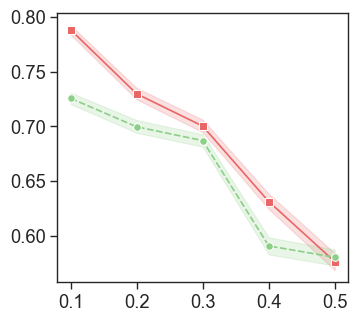

In [64]:
plot_palette = {"STADiffuser": method_palette["stadiff"],
                "SRTSim": method_palette["SRT_domain"]}
plot_rates = [0.1, 0.2, 0.3, 0.4, 0.5]
# plot the gene correlation lineplot with mean and std
fig, ax = plt.subplots(1, 1, figsize=(3.75, 3.5))
#plot the gene correlation lineplot
gene_corr_df_sub = gene_corr_df.iloc[:, [0, 1, 2, 3, 4, 8]]
# gene_corr_df has the first 5 columns corresponding to plot_rates and the last column is the method
# melt the dataframe for seaborn. The columns names are ["0.1", "0.2", "0.3", "0.4", "0.5", "method"] to long format
gene_corr_df_sub = gene_corr_df_sub.melt(id_vars=["method"], var_name="missing_rate", value_name="gene_corr")
sns.lineplot(data=gene_corr_df_sub, x="missing_rate", y="gene_corr", hue="method", ax=ax,
             palette=plot_palette, markers=["s", "o"], style="method", ci=95, markersize=5.5)
# hide legend
ax.legend().remove()
ax.set_xlabel("")
ax.set_ylabel("")
# save to disk
fig.savefig("{}/gene_corr_varying_missing_rate.png".format(figure_dir), dpi=600)

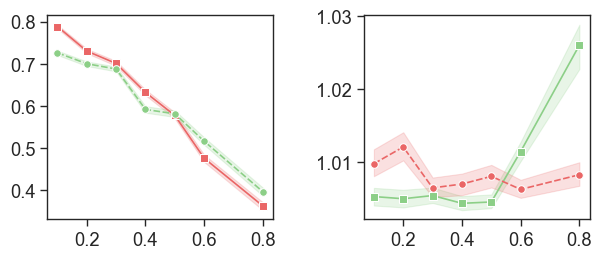

In [36]:
# plot the gene correlation lineplot with mean and std
fig, axes = plt.subplots(1, 2, figsize=(7, 2.65))
#plot the gene correlation lineplot
ax = axes[0]
sns.lineplot(data=gene_corr_df, x="missing_rate", y="gene_corr", hue="method", ax=ax,
             palette=plot_palette, markers=["s", "o"], style="method", ci=95, markersize=5.5)
# remove legend
ax.legend().remove()
ax.set_xlabel("")
ax.set_ylabel("")
# plot mLISI lineplot
ax = axes[1]


sns.lineplot(data=lsi_df, x="missing_rate", y="lsi", hue="method", ax=ax,
             palette=plot_palette, markers=["s", "o"], style="method", ci=95, markersize=5.5)
# remove legend
ax.legend().remove()
ax.set_xlabel("")
ax.set_ylabel("")
plt.subplots_adjust(wspace=0.4)
# save to disk
# fig.savefig("{}/mLSI_and_corr_varying_missing_rate.png".format(figure_dir), dpi=300)

In [39]:
adata_raw = sc.read_h5ad("../output/App1-DLPFC/{}/adata_raw.h5ad".format("151676"))
gene_corr_df = pd.DataFrame(np.array(stadiff_corr_list).T)
# 3000 genes with respect to the seven missing rates
gene_corr_df = gene_corr_df.set_index(adata.var_names)
# set column names
gene_corr_df.columns = missing_rates
gene_nonzero_rate = np.array((adata_raw.X > 0).sum(axis=0) / adata_raw.X.shape[0]).flatten()
gene_corr_df["slope"] = gene_corr_df.apply(lambda x: np.polyfit(missing_rates, x, 1)[0], axis=1)
gene_corr_df["method"] = "STADiffuser"
gene_corr_df["gene_nonzero_rate"] = np.log(1 + gene_nonzero_rate)
# append srt_corr_list
srt_corr_df = pd.DataFrame(np.array(srt_corr_list).T)
srt_corr_df = srt_corr_df.set_index(adata.var_names)
srt_corr_df.columns = missing_rates
srt_corr_df["slope"] = srt_corr_df.apply(lambda x: np.polyfit(missing_rates, x, 1)[0], axis=1)
srt_corr_df["method"] = "SRTSim"
srt_corr_df["gene_nonzero_rate"] = np.log(1 + gene_nonzero_rate)

# append to gene_corr_df
gene_corr_df = pd.concat([gene_corr_df, srt_corr_df])
gene_corr_df
# apply linear regression to compute the slope

,0.1,0.2,0.3,0.4,0.5,0.6,0.8,slope,method,gene_nonzero_rate
AL669831.5,0.708869,0.743418,0.703899,0.613265,0.676613,0.437648,0.205348,-0.725302,STADiffuser,0.019911
SAMD11,0.775276,0.687221,0.689024,0.540684,0.502347,0.308129,0.375509,-0.666344,STADiffuser,0.007549
KLHL17,0.762424,0.708384,0.681847,0.310508,0.230991,0.113897,0.110533,-1.119400,STADiffuser,0.029296
ISG15,0.917254,0.871585,0.877139,0.853505,0.855392,0.791679,0.554961,-0.439175,STADiffuser,0.213126
AL390719.2,0.743039,0.701337,0.737176,0.614560,0.569152,0.476579,-0.118401,-1.105134,STADiffuser,0.005233
...,...,...,...,...,...,...,...,...,...,...
MT-ATP8,0.879229,0.914340,0.920257,0.859490,0.887463,0.830463,0.736648,-0.215958,SRTSim,0.634788
MT-ND3,0.590988,0.569629,0.721784,0.593000,0.596517,0.622167,0.541088,-0.067082,SRTSim,0.693001
MT-CYB,0.621933,0.637336,0.761885,0.650706,0.656793,0.697760,0.648223,0.021529,SRTSim,0.693147
AC011043.1,0.391895,0.625791,0.655627,0.436931,0.635105,0.336117,0.062455,-0.566560,SRTSim,0.005812


PearsonRResult(statistic=0.3814683545674852, pvalue=1.598740964568446e-104)
PearsonRResult(statistic=0.3965045621256982, pvalue=1.6340907892127195e-113)


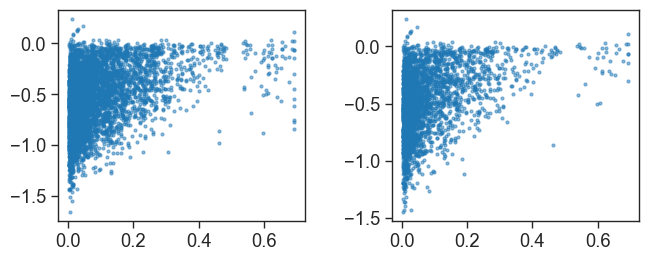

In [40]:
# plot slope vs gene_nonzero_rate
fig, axes = plt.subplots(1, 2, figsize=(7.5, 2.75))
# plot the scatter plot with light blue
temp_df = gene_corr_df[gene_corr_df["method"] == "STADiffuser"]
not axes[0].scatter(gene_corr_df["gene_nonzero_rate"], gene_corr_df["slope"], color="#1f77b4",
           alpha=0.5, s=5)
print(scipy.stats.pearsonr(temp_df["gene_nonzero_rate"], temp_df["slope"]))
temp_df = gene_corr_df[gene_corr_df["method"] == "SRTSim"]
axes[1].scatter(temp_df["gene_nonzero_rate"], temp_df["slope"], color="#1f77b4",
                s=5, alpha=0.5)
print(scipy.stats.pearsonr(temp_df["gene_nonzero_rate"], temp_df["slope"]))
# set subplots horizontal margin
plt.subplots_adjust(wspace=0.35)
# save to disk
# fig.savefig("{}/slope_vs_gene_nonzero_rate.png".format(figure_dir), dpi=600)

In [41]:
temp_df = gene_corr_df[gene_corr_df["method"] == "SRTSim"]
# find slope smaller than 0, greater than -0.5 and gene_nonzero_rate greater than 0.2
temp_gene_df = temp_df[(temp_df["slope"] < -0.25) & (temp_df["gene_nonzero_rate"] > 0.1)]
temp_gene_df

,0.1,0.2,0.3,0.4,0.5,0.6,0.8,slope,method,gene_nonzero_rate
ISG15,0.915888,0.900272,0.883846,0.858342,0.827660,0.825421,0.609716,-0.386228,SRTSim,0.213126
CPTP,0.790737,0.824627,0.746361,0.672926,0.643919,0.429460,0.382429,-0.681859,SRTSim,0.115741
DVL1,0.751127,0.737403,0.741980,0.693798,0.638712,0.652001,0.399412,-0.455863,SRTSim,0.217825
MIB2,0.865804,0.843318,0.842253,0.773933,0.755346,0.716515,0.488732,-0.498642,SRTSim,0.161163
FAAP20,0.674589,0.764396,0.701053,0.532994,0.675624,0.455509,0.386136,-0.493741,SRTSim,0.151190
...,...,...,...,...,...,...,...,...,...,...
TSPO,0.748599,0.607969,0.721294,0.572153,0.446101,0.526095,0.386029,-0.491500,SRTSim,0.144906
MLC1,0.703914,0.579367,0.635682,0.452367,0.689809,0.523781,0.456520,-0.263950,SRTSim,0.244653
PCP4,0.913098,0.895081,0.924767,0.849075,0.880479,0.861278,0.673250,-0.291163,SRTSim,0.380777
LSS,0.812532,0.731423,0.697719,0.579001,0.696806,0.493396,0.561022,-0.379722,SRTSim,0.110796


In [46]:
missing_rates

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8]

--------------------
Remove 343 nodes and 3812 edges from the original data
--------------------
Remove 685 nodes and 7190 edges from the original data
--------------------
Remove 1026 nodes and 10130 edges from the original data
--------------------
Remove 1369 nodes and 12818 edges from the original data
--------------------
Remove 1709 nodes and 15030 edges from the original data
ad_ind 0
ad_ind 1
ad_ind 2
ad_ind 3
ad_ind 4
STADiffuser:  GAD1 [0.9160362027507687, 0.9137814616640847, 0.887314851938217, 0.8532887004256741, 0.8574375711755831]
SRTSim:  GAD1 [0.9062853582777601, 0.8891711289862194, 0.8773566301510676, 0.7897711557652833, 0.8672298338811917]
--------------------
Remove 343 nodes and 3812 edges from the original data
--------------------
Remove 685 nodes and 7190 edges from the original data
--------------------
Remove 1026 nodes and 10130 edges from the original data
--------------------
Remove 1369 nodes and 12818 edges from the original data
--------------------
Remove

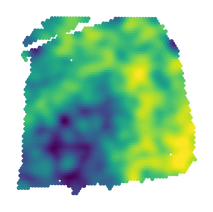

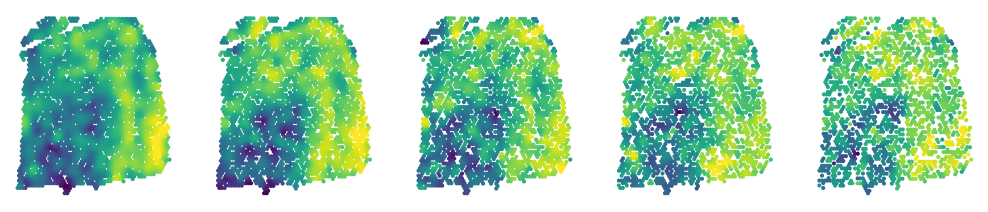

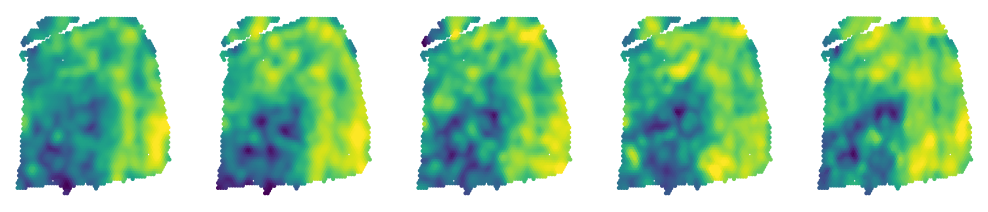

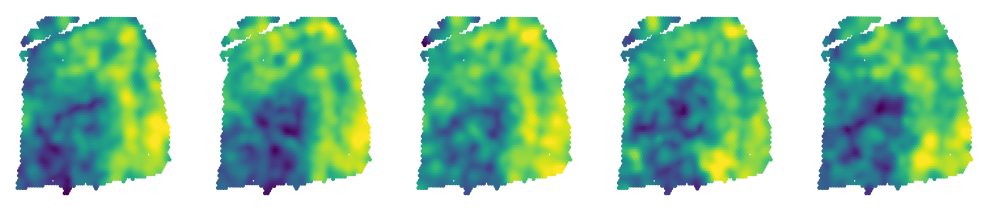

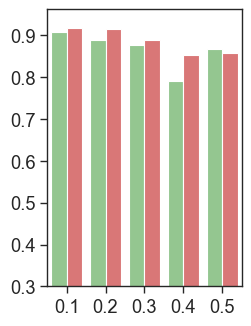

...

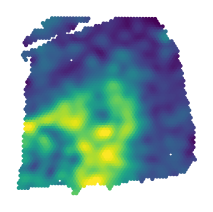

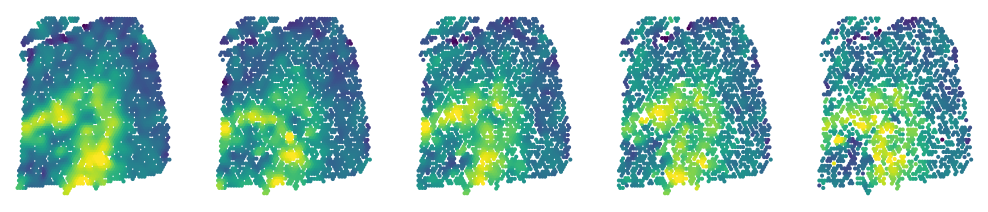

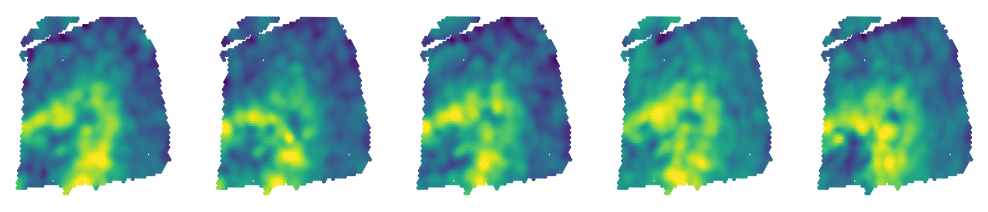

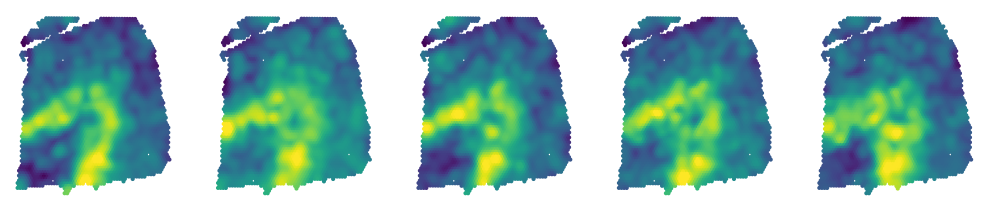

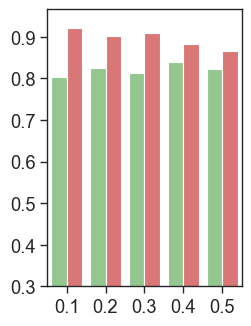

In [47]:
gene_names = ["GAD1", "MAP2K1", "B3GALT2", "KRT17"]
plot_rates = [0.1, 0.2, 0.3, 0.4, 0.5]
factor = 0.8
dot_size = 35
# create a text to save the correlation
with open("{}/imputation_summary.txt".format(output_dir), "w") as f:
    f.write("Gene\tMissing rate\tSTADiffuser\tSRTSim\n")
# plot gene spatial expression w.r.t missing rate
for gene_name in gene_names:
    n_plots = len(plot_rates)
    # plot ground truth
    fig, ax = plt.subplots(1, 1, figsize=(2.5, 2.5))
    sc.pl.embedding(upside_down(adata_real_recon), basis="spatial", color=gene_name, ax=ax,
                    show=False, wspace=0.05, frameon=False, cmap="viridis", vmax="p99.5", size=dot_size)
    # remove colorbar and set title empty
    ax.collections[0].colorbar.remove()
    ax.set_title("")
    # save to disk
    fig.savefig("{}/embedding_{}_gt.png".format(figure_dir, gene_name), dpi=600)
    # plot the observed
    fig, axes = plt.subplots(1, n_plots, figsize=(n_plots * 2.5, 2.5))
    for ax_ind, missing_rate in enumerate(plot_rates):
        ad_ind = missing_rates.index(missing_rate)
        obs_adata = adata.copy()
        obs_adata = mask_region(obs_adata, "random_{}".format(missing_rate))
        # read autoencoder
        autoencoder_masked = torch.load("{}/{}/autoencoder_attn2.pth".format(output_dir, "random_{}".format(missing_rate)),
                                        map_location="cuda:0").to(device)
        # prepare the dataset
        data = pipeline.prepare_dataset(obs_adata, device=device, use_net="spatial_net")
        # get the reconstruction
        obs_adata_recon = get_recon(obs_adata, autoencoder_masked, device=device, use_net="spatial_net",
                                    apply_normalize=False)
        obs_adata_recon.var_names = adata.var_names
        sc.pl.embedding(upside_down(obs_adata_recon), basis="spatial", color=gene_name, ax=axes[ax_ind],
                        show=False, wspace=0.05, frameon=False, cmap="viridis", vmax="p99.5", size=dot_size)
        axes[ax_ind].collections[0].colorbar.remove()
        axes[ax_ind].set_title("")
    # save to disk
    fig.savefig("{}/embedding_{}_obs.png".format(figure_dir, gene_name), dpi=600)
    # plot stadiff recovered
    fig, axes = plt.subplots(1, n_plots, figsize=(n_plots * 2.5, 2.5))
    stadiff_corr = []
    for ax_ind, missing_rate in enumerate(plot_rates):
        ad_ind = missing_rates.index(missing_rate)
        print("ad_ind", ad_ind)
        sim_adata = stadiff_sim_list[ad_ind]
        sim_adata.obsm["spatial"] = adata.obsm["spatial"]
        sc.pl.embedding(upside_down(sim_adata), basis="spatial", color=gene_name, ax=axes[ax_ind],
                        show=False, wspace=0.05, frameon=False, cmap="viridis", vmax="p99.5", size=dot_size)
        axes[ax_ind].collections[0].colorbar.remove()
        axes[ax_ind].set_title("")
        # compute the correlation
        stadiff_corr.append(scipy.stats.pearsonr(sim_adata.X[:, adata.var_names == gene_name].flatten(),
                                                 adata_real_recon.X[:, adata.var_names == gene_name].flatten())[0])
    fig.savefig("{}/embedding_{}_stadiff.png".format(figure_dir, gene_name), dpi=600)
    print("STADiffuser: ", gene_name, stadiff_corr)
    # plot srt recovered
    fig, axes = plt.subplots(1, len(plot_rates), figsize=(len(plot_rates) * 2.5, 2.5))
    srt_corr = []
    for ax_ind, missing_rate in enumerate(plot_rates):
        ad_ind = missing_rates.index(missing_rate)
        sim_adata = srt_sim_recon_list[ad_ind]
        sim_adata.obsm["spatial"] = adata.obsm["spatial"]
        sim_adata.var_names = adata.var_names
        sc.pl.embedding(upside_down(sim_adata), basis="spatial", color=gene_name, ax=axes[ax_ind],
                        show=False, wspace=0.05, frameon=False, cmap="viridis", vmax="p99.5", size=dot_size)
        axes[ax_ind].collections[0].colorbar.remove()
        axes[ax_ind].set_title("")
        # compute the correlation
        srt_corr.append(scipy.stats.pearsonr(sim_adata.X[:, adata.var_names == gene_name].flatten(),
                                             adata_real_recon.X[:, adata.var_names == gene_name].flatten())[0])
    fig.savefig("{}/embedding_{}_srt.png".format(figure_dir, gene_name), dpi=600)
    print("SRTSim: ", gene_name, srt_corr)
    # plot barplot
    fig, ax = plt.subplots(1, 1, figsize=(2.75, 3.5))
    missing_corr_df = pd.DataFrame({"missing_rate": np.tile(plot_rates, 2),
                                    "method": np.repeat(["STADiffuser", "SRTSim"], len(plot_rates)),
                                    "gene_corr": np.concatenate([stadiff_corr, srt_corr])})
    sns.barplot(data=missing_corr_df, x="missing_rate", y="gene_corr", hue="method", ax=ax,
                palette=plot_palette, hue_order=["SRTSim", "STADiffuser"])
    # remove legend
    ax.set_ylim(0.3, np.max(stadiff_corr) * 1.05)
    ax.legend().remove()
    ax.set_xlabel("")
    ax.set_ylabel("")
    plt.tight_layout()
    fig.savefig("{}/sr_barplot_{}.png".format(figure_dir, gene_name), dpi=600)
    # write to file
    with open("{}/imputation_summary.txt".format(output_dir), "a") as f:
        for ind, missing_rate in enumerate(plot_rates):
            f.write("{}\t{}\t{:.3f}\t{:.3f}\n".format(gene_name, missing_rate, stadiff_corr[ind], srt_corr[ind]))
        for ind, missing_rate in enumerate(plot_rates):
            f.write("{}\t{}\t{:.3f}\t{:.3f}\n".format(gene_name, missing_rate, stadiff_corr[ind], srt_corr[ind]))

In [331]:
np.repeat(["STADiffuser", "SRTSim"], len(plot_rates))

array(['STADiffuser', 'STADiffuser', 'STADiffuser', 'STADiffuser',
       'SRTSim', 'SRTSim', 'SRTSim', 'SRTSim'], dtype='<U11')

Text(0, 0.5, '')

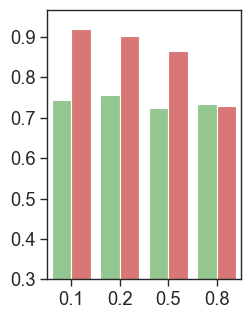

In [339]:
# plot the bar plot srt_corr_list and stadiff_corr_list for gene_name


## Multiuple Sample simulation

In this study, we trained a classifier to predict the layer and check the generated structure demonstrating.


In [3]:
output_dir = "../output/App1-DLPFC/"
adata_multi = sc.read_h5ad("{}//adata_multi.h5ad".format(output_dir))
output_dir = "../output/App1-DLPFC/multi-slices"
adata_multi

AnnData object with n_obs × n_vars = 14364 × 1830
    obs: 'in_tissue', 'array_row', 'array_col', 'ground_truth', 'slice_id'
    uns: 'spatial_net'
    obsm: 'new_spatial', 'spatial'

In [4]:
dnoiser = torch.load("{}/denoiser.pth".format(output_dir), map_location="cuda:0")
autoencoder_pre = torch.load("{}/autoencoder_pre.pth".format(output_dir), map_location="cuda:0").to(device)
adata_pre = get_recon(adata_multi, autoencoder_pre, device=device, use_net="spatial_net", apply_normalize=False)
sc.pp.neighbors(adata_pre, use_rep="latent", n_neighbors=30)
sc.tl.umap(adata_pre, min_dist=0.5)

[<Axes: title={'center': 'ground_truth'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'slice_id'}, xlabel='UMAP1', ylabel='UMAP2'>]

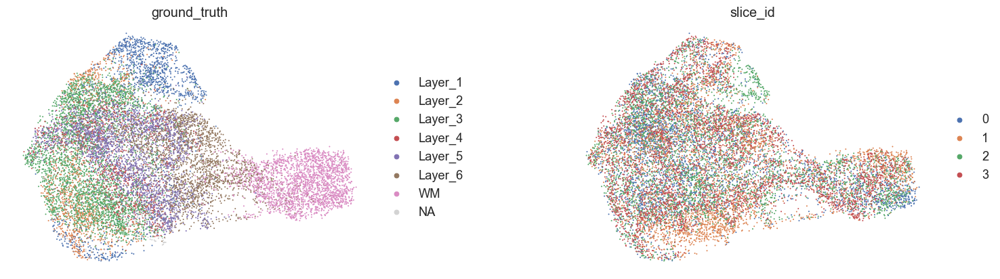

In [5]:
sc.pl.umap(adata_pre, color=["ground_truth", "slice_id"], ncols=2, frameon=False, wspace=0.4,
           use_raw=False, show=False)

[<Axes: title={'center': 'ground_truth'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'slice_id'}, xlabel='UMAP1', ylabel='UMAP2'>]

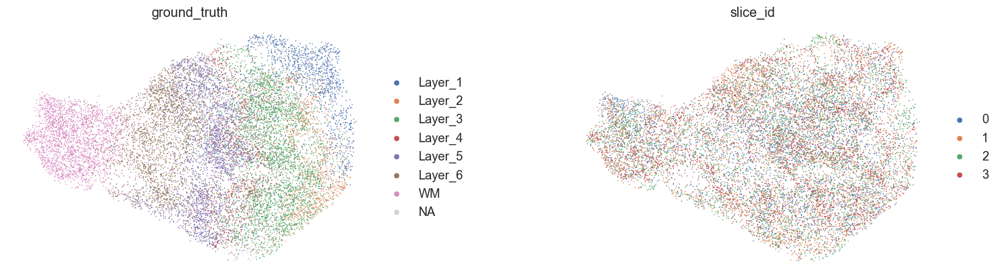

In [6]:
autoencoder = torch.load("{}/autoencoder_tri.pth".format(output_dir), map_location="cuda:0").to(device)
adata_aligned = get_recon(adata_multi, autoencoder, device=device, use_net="spatial_net", apply_normalize=False)
sc.pp.neighbors(adata_aligned, use_rep="latent", n_neighbors=30)
sc.tl.umap(adata_aligned, min_dist=0.5)
sc.pl.umap(adata_aligned, color=["ground_truth", "slice_id"],
           ncols=2, frameon=False, wspace=0.4,
           use_raw=False, show=False,
           s=5)

In [7]:
adata_single = adata_multi[adata_multi.obs["slice_id"] == "2"].copy()
spatial_net = adata_single.uns["spatial_net"].copy()
# keep colum that Cell1 and Cell2 columns are botin in adata_single.obs_names
index = spatial_net["Cell1"].isin(adata_single.obs_names) & spatial_net["Cell2"].isin(adata_single.obs_names)
spatial_net = spatial_net[index]
adata_single.uns["spatial_net"] = spatial_net
adata_single_pre = get_recon(adata_single, autoencoder_pre, device=device, use_net="spatial_net", apply_normalize=False)

[<Axes: title={'center': 'ground_truth'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'slice_id'}, xlabel='UMAP1', ylabel='UMAP2'>]

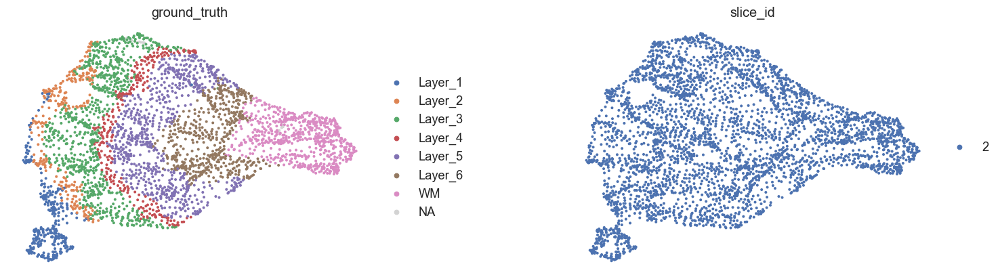

In [8]:
sc.pp.neighbors(adata_single_pre, use_rep="latent", n_neighbors=30)
sc.tl.umap(adata_single_pre, min_dist=0.5)
# plot umap
sc.pl.umap(adata_single_pre, color=["ground_truth", "slice_id"], ncols=2, frameon=False, wspace=0.4,
           use_raw=False, show=False)

In [9]:
# extract the latent
total_latent = adata_aligned.obsm["latent"]
labels = adata_aligned.obs["ground_truth"].to_numpy().astype("str")
# remove na
index = labels == "nan"
total_latent = total_latent[~index, :]
labels = labels[~index]

In [10]:
# contruct a torch dataset with latent and labels and train a classifier
# convert labels to integer
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)
# contruct a torch dataset with latent and labels
dataset_latent = torch.utils.data.TensorDataset(torch.tensor(total_latent, dtype=torch.float32),
                                                torch.tensor(labels, dtype=torch.long))
# split the dataset by 80% training and 20% testing
train_size = int(0.8 * len(dataset_latent))
test_size = len(dataset_latent) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset_latent, [train_size, test_size])
# create a dataloader
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=128, shuffle=False)

In [11]:
# create a MLP classifier
from torch import nn

class MLPClassifier(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=128, skip=False):
        super(MLPClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)
        self.relu = nn.ReLU()
        self.skip = skip

    def forward(self, x):
        h = self.fc1(x)
        h = self.relu(h)
        h = self.fc2(h)
        h1 = h
        h = self.relu(h)
        if self.skip:
            h = h + h1
        h = self.fc3(h)
        return h

mlp_classifier = MLPClassifier(total_latent.shape[1], len(label_encoder.classes_)).to(device)

In [12]:
# train the classifier and print the accuracy
from tqdm.auto import tqdm
optimizer = torch.optim.Adam(mlp_classifier.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()
n_epochs = 500
pbar = tqdm(range(n_epochs))
acc_list = []
best_acc = 0
for epoch in range(n_epochs):
    mlp_classifier.train()
    for data, target in train_loader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = mlp_classifier(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        # compute the accuracy
        mlp_classifier.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for data, target in test_loader:
                data, target = data.to(device), target.to(device)
                output = mlp_classifier(data)
                _, predicted = torch.max(output, 1)
                total += target.size(0)
                correct += (predicted == target).sum().item()
        accuracy = 100 * correct / total
        acc_list.append(accuracy)
        if accuracy > best_acc:
            best_acc = accuracy
            torch.save(mlp_classifier, "{}/mlp_classifier.pth".format(output_dir))
        pbar.set_description("Epoch: {}, Accuracy: {:.2f}".format(epoch, accuracy))
    pbar.update(1)

  0%|          | 0/500 [00:00<?, ?it/s]

In [13]:
# train the classifier and print the accuracy
skip_mlp_classifier = MLPClassifier(total_latent.shape[1], len(label_encoder.classes_), skip=True).to(device)
optimizer = torch.optim.Adam(skip_mlp_classifier.parameters(), lr=0.001, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=150, gamma=0.1)
n_epochs = 500
pbar = tqdm(range(n_epochs))
skip_acc_list = []
best_acc = 0
for epoch in range(n_epochs):
    skip_mlp_classifier.train()
    for data, target in train_loader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = skip_mlp_classifier(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
    scheduler.step()
    if epoch % 10 == 0:
        # compute the accuracy
        skip_mlp_classifier.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for data, target in test_loader:
                data, target = data.to(device), target.to(device)
                output = skip_mlp_classifier(data)
                _, predicted = torch.max(output, 1)
                total += target.size(0)
                correct += (predicted == target).sum().item()
        accuracy = 100 * correct / total
        skip_acc_list.append(accuracy)
        if accuracy > best_acc:
            best_acc = accuracy
            torch.save(skip_mlp_classifier, "{}/skip_mlp_classifier.pth".format(output_dir))
        pbar.set_description("Epoch: {}, Accuracy: {:.2f}".format(epoch, accuracy))
    pbar.update(1)

  0%|          | 0/500 [00:00<?, ?it/s]

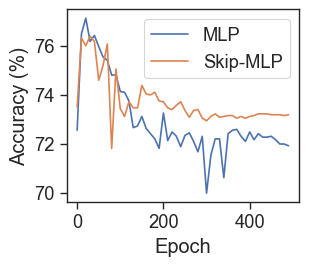

In [15]:
# plot the accuracy
fig, ax = plt.subplots(1, 1, figsize=(3, 2.5))
ax.plot(range(0, n_epochs, 10), acc_list, label="MLP")
ax.plot(range(0, n_epochs, 10), skip_acc_list, label="Skip-MLP")
ax.set_xlabel("Epoch")
ax.set_ylabel("Accuracy (%)")
ax.legend()

In [16]:
# load the best classifier
skip_mlp_classifier = torch.load("{}/skip_mlp_classifier.pth".format(output_dir)).to(device)

In [17]:
adata_single_aligned = get_recon(adata_single, autoencoder, device=device, use_net="spatial_net", apply_normalize=False)

In [18]:
predicted_labels = torch.max(skip_mlp_classifier(torch.tensor(adata_single_aligned.obsm["latent"], dtype=torch.float32).to(device)), 1)[1].cpu().numpy()
adata_single_aligned.obs["predicted_labels"] = label_encoder.inverse_transform(predicted_labels).astype(str)

[<Axes: title={'center': 'ground_truth'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'predicted_labels'}, xlabel='spatial1', ylabel='spatial2'>]

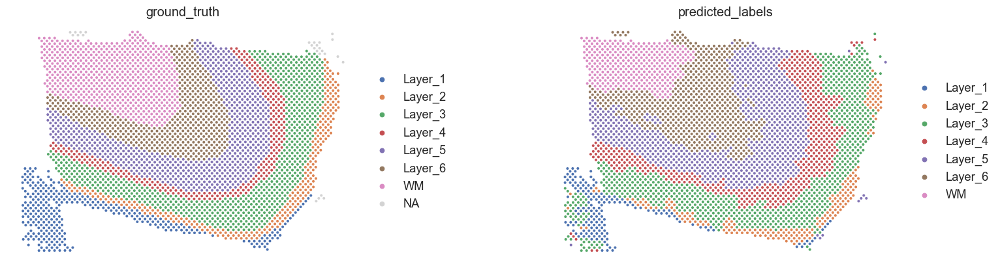

In [19]:
sc.pl.embedding(adata_single_aligned, basis="spatial", color=["ground_truth", "predicted_labels"], ncols=2, frameon=False, wspace=0.4,
                use_raw=False, show=False)

[<Axes: title={'center': 'ground_truth'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'predicted_labels'}, xlabel='UMAP1', ylabel='UMAP2'>]

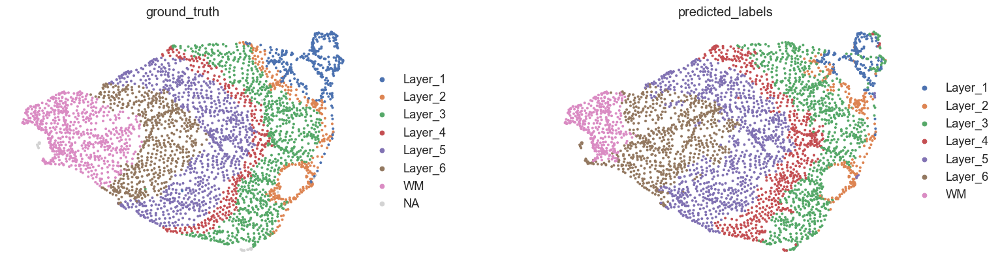

In [21]:
# perform umap
sc.pp.neighbors(adata_single_aligned, use_rep="latent", n_neighbors=15)
sc.tl.umap(adata_single_aligned, min_dist=0.5)
sc.pl.umap(adata_single_aligned, color=["ground_truth", "predicted_labels"], ncols=2, frameon=False, wspace=0.4,
           use_raw=False, show=False)

In [22]:
# simulated data from the noiser
normalizer = stutils.MinMaxNormalize(adata_aligned.obsm["latent"], dim=0)
data_temp = pipeline.prepare_dataset(adata_single, device=device, use_net="spatial_net")
adata_sim = pipeline.simulate(dnoiser, autoencoder, device=device, use_net="spatial_net",
                              ref_data=adata_single, spatial_coord=adata_single.obsm["new_spatial"],
                              seed=1, normarlizer=normalizer)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [23]:
predicted_labels = torch.max(skip_mlp_classifier(torch.tensor(adata_sim.obsm["latent"], dtype=torch.float32).to(device)), 1)[1].cpu().numpy()
adata_sim.obs["predicted_labels"] = label_encoder.inverse_transform(predicted_labels).astype(str)
sc.pp.neighbors(adata_sim, use_rep="latent", n_neighbors=15)
sc.tl.umap(adata_sim, min_dist=0.5)

In [24]:
spatial_ori = adata_single.obsm["spatial"].copy()
adata_sim.obsm["spatial"] = spatial_ori

[<Axes: title={'center': 'ground_truth'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'predicted_labels'}, xlabel='UMAP1', ylabel='UMAP2'>]

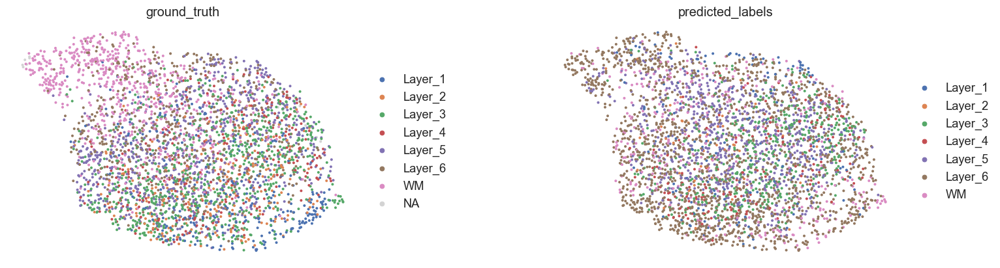

In [25]:
sc.pl.umap(adata_sim, color=["ground_truth", "predicted_labels"], ncols=2, frameon=False, wspace=0.4,
           use_raw=False, show=False)

[<Axes: title={'center': 'ground_truth'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'predicted_labels'}, xlabel='spatial1', ylabel='spatial2'>]

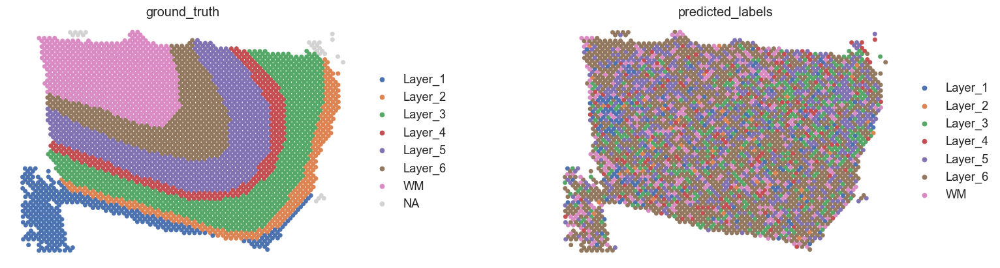

In [26]:
# perform umap
sc.pl.embedding(adata_sim, basis="spatial", color=["ground_truth", "predicted_labels"], ncols=2, frameon=False, wspace=0.4,
           use_raw=False, show=False, s=100)